In [30]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score
import joblib
import os

In [31]:
# Load data
df = pd.read_csv("../data/train.csv")

In [32]:
# Encode categorical
df['Gender'] = df['Gender'].map({'Male': 0, 'Female': 1})
df['Vehicle_Damage'] = df['Vehicle_Damage'].map({'No': 0, 'Yes': 1})

In [33]:
# Select features
X = df[['Age', 'Gender', 'Region_Code', 'Previously_Insured',
        'Vehicle_Damage', 'Annual_Premium', 'Policy_Sales_Channel', 'Vintage']]
y = df['Response']


In [34]:
# Split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [35]:
# Model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')
model.fit(X_train, y_train)

c:\Users\Anurag mishra\sbilife_churnmodel\venv\Lib\site-packages\xgboost\training.py:183: UserWarning: [23:48:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

In [36]:
# Eval
print(classification_report(y_val, model.predict(X_val)))
print("ROC AUC:", roc_auc_score(y_val, model.predict_proba(X_val)[:, 1]))

              precision    recall  f1-score   support

           0       0.88      1.00      0.93     66699
           1       0.47      0.02      0.04      9523

    accuracy                           0.87     76222
   macro avg       0.67      0.51      0.49     76222
weighted avg       0.83      0.87      0.82     76222

ROC AUC: 0.8562763162984718


In [37]:
# Save model
os.makedirs("../model", exist_ok=True)
joblib.dump(model, "../model/sbilife_churn_model.pkl")

['../model/sbilife_churn_model.pkl']

In [38]:
import numpy as np
from sklearn.metrics import f1_score

# Get predicted probabilities on validation data
val_probs = model.predict_proba(X_val)[:,1]
# Try thresholds from 0 to 1
thresholds = np.linspace(0,1,101)
f1_scores = [f1_score(y_val, (val_probs>t).astype(int)) for t in thresholds]
best_threshold = thresholds[np.argmax(f1_scores)]
print("Optimal threshold based on F1 score:", best_threshold)

Optimal threshold based on F1 score: 0.22


In [39]:
from sklearn.metrics import accuracy_score

y_pred = model.predict(X_val)
acc = accuracy_score(y_val, y_pred)
print("Validation Accuracy:", acc)

Validation Accuracy: 0.8747343286715121


  Using cached matplotlib-3.7.1.tar.gz (38.0 MB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
Failed to build matplotlib
Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  × Building wheel for matplotlib (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [588 lines of output]
      
      Edit mplsetup.cfg to change the build options; suppress output with --quiet.
      
      BUILDING MATPLOTLIB
            python: yes [3.12.9 (tags/v3.12.9:fdb8142, Feb  4 2025, 15:27:58) [MSC
                        v.1942 64 bit (AMD64)]]
          platform: yes [win32]
             tests: no  [skipping due to configuration]
            macosx: no  [Mac OS-X only]
      
      C:\Users\Anurag mishra\AppData\Local\Temp\pip-build-env-sok4u5s2\overlay\Lib\site-packages\setuptools\dist.py:804: SetuptoolsDeprecationWarning: The namespace_packages parameter is deprecated.
      !!
      
              ********************************************************************************
              Please replace its usage with implicit namespaces (PEP 420).
      
              See https://setuptools.pypa.io/en/latest/r

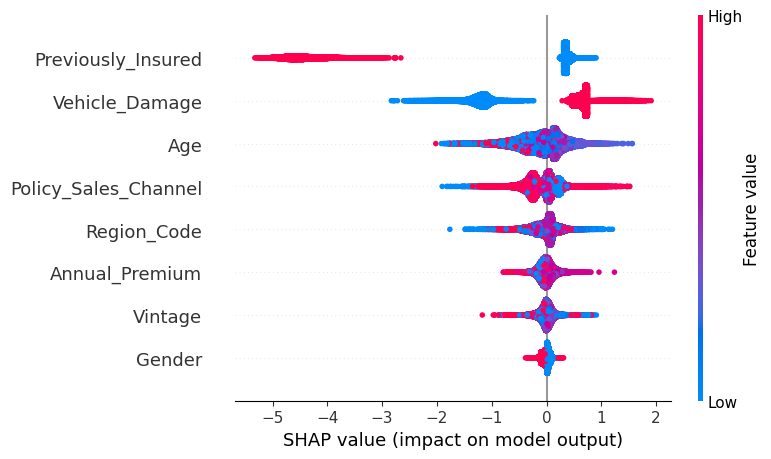

In [40]:
%pip install matplotlib==3.7.1
%matplotlib inline
import matplotlib.pyplot as plt 
import shap
shap._HAS_MATPLOTLIB = True
# Use TreeExplainer for XGBoost models
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_val)

# Display a summary plot
shap.summary_plot(shap_values, X_val)
plt.show()

In [41]:
# Print the shape and some values for debugging
print("SHAP values shape:", shap_values.shape)
print(shap_values)

# Convert the SHAP values array to a list for JSON serialization
shap_data = shap_values.tolist()
print("Converted SHAP data:", shap_data)

SHAP values shape: (76222, 8)
[[-0.67618376 -0.0296693   0.26212573 ... -0.0567993  -0.00496693
  -0.00852871]
 [-0.05166539  0.03724162 -0.17151938 ... -0.0162991   0.20007865
  -0.03359137]
 [ 0.17296073 -0.01619916  0.04907529 ... -0.03763245  0.1613074
  -0.01808137]
 ...
 [-0.1384682  -0.05213753 -0.46258953 ... -0.14740242 -0.39377034
  -0.05308784]
 [-0.7431123   0.02395074  0.07070734 ...  0.18001938 -0.14119384
  -0.10429406]
 [-0.5896087   0.02711242 -0.23015152 ... -0.0624184  -0.10103337
  -0.01666572]]
Converted SHAP data: [[-0.6761837601661682, -0.029669297859072685, 0.26212573051452637, -4.805927753448486, -1.1383111476898193, -0.056799303740262985, -0.004966934211552143, -0.008528707548975945], [-0.05166538804769516, 0.0372416153550148, -0.17151938378810883, 0.368396133184433, 0.6773141026496887, -0.01629909686744213, 0.20007865130901337, -0.0335913710296154], [0.17296072840690613, -0.016199158504605293, 0.04907528683543205, 0.3477916121482849, 0.7216488122940063, -0.03